In [5]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout, BatchNormalization
from tensorflow.keras import Input, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from glob import glob
import numpy as np

In [6]:
# Paths to your images and masks folders in Google Drive
images_path = 'C:/Users/khadi/OneDrive/Desktop/FYP/images/'
masks_path = 'C:/Users/khadi/OneDrive/Desktop/FYP/labels/'


# Get sorted lists of image and mask paths
image_files = sorted(glob(images_path + '*.png'))
mask_files = sorted(glob(masks_path + '*.png'))

# Check the length of image_files and mask_files
print("Number of image files:", len(image_files))
print("Number of mask files:", len(mask_files))
# Print paths
print("Images path:", images_path)
print("Masks path:", masks_path)



Number of image files: 305
Number of mask files: 305
Images path: C:/Users/khadi/OneDrive/Desktop/FYP/images/
Masks path: C:/Users/khadi/OneDrive/Desktop/FYP/labels/


In [7]:
# Splitting data into training and testing sets
train_images, val_images, train_masks, val_masks = train_test_split(image_files, mask_files, test_size=0.2, random_state=42)

print(f"Training with {len(train_images)} images and {len(train_masks)} masks.")
print(f"Validating with {len(val_images)} images and {len(val_masks)} masks.")



Training with 244 images and 244 masks.
Validating with 61 images and 61 masks.


In [8]:
def load_and_process_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [256, 256])
    return image



In [9]:
def load_and_process_mask(mask_path):
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.where(mask > 0, tf.ones_like(mask), tf.zeros_like(mask))
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    mask = tf.image.resize(mask, [256, 256])
    return mask



In [10]:
def process_path(image_path, mask_path):
    image = load_and_process_image(image_path)
    mask = load_and_process_mask(mask_path)
    return image, mask

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_masks))
train_dataset = train_dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.cache().shuffle(1000).batch(16).prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((val_images, val_masks))
val_dataset = val_dataset.map(process_path, num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(16).prefetch(tf.data.AUTOTUNE)



In [11]:
def unet_model(input_size=(256, 256, 3), num_classes=1):
    inputs = Input(input_size)

    # Contraction path
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.1)(p1)

    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.1)(p2)

    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.2)(p3)

    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)
    p4 = Dropout(0.2)(p4)

    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = BatchNormalization()(c5)
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)
    c5 = BatchNormalization()(c5)

    # Expansive path
    u6 = Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(0.2)(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = BatchNormalization()(c6)
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
    c6 = BatchNormalization()(c6)

    u7 = Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(0.2)(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = BatchNormalization()(c7)
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
    c7 = BatchNormalization()(c7)

    u8 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(0.1)(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = BatchNormalization()(c8)
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
    c8 = BatchNormalization()(c8)

    u9 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(0.1)(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = BatchNormalization()(c9)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
    c9 = BatchNormalization()(c9)

    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

callbacks = [
    EarlyStopping(patience=10, monitor='val_loss', verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1)
]



Epoch 1/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 163s 9s/step - accuracy: 0.4821 - loss: 0.8284 - val_accuracy: 0.0037 - val_loss: 12845.6807 - learning_rate: 0.0010
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 167s 11s/step - accuracy: 0.7782 - loss: 0.5960 - val_accuracy: 0.0145 - val_loss: 87.3803 - learning_rate: 0.0010
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 169s 11s/step - accuracy: 0.8708 - loss: 0.5163 - val_accuracy: 0.2004 - val_loss: 2.8686 - learning_rate: 0.0010
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 154s 10s/step - accuracy: 0.8802 - loss: 0.4388 - val_accuracy: 0.6640 - val_loss: 0.7446 - learning_rate: 0.0010
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 149s 9s/step - accuracy: 0.8870 - loss: 0.3620 - val_accuracy: 0.8910 - val_loss: 0.2498 - learning_rate: 0.0010
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 142s 9s/step - accuracy: 0.8709 - loss: 0.2898 - val_accuracy: 0.8910 - val_loss: 0.1361 - learning_rate: 0.0010
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 141s 9s/step - accuracy: 0.8801 - loss: 0.2267 -

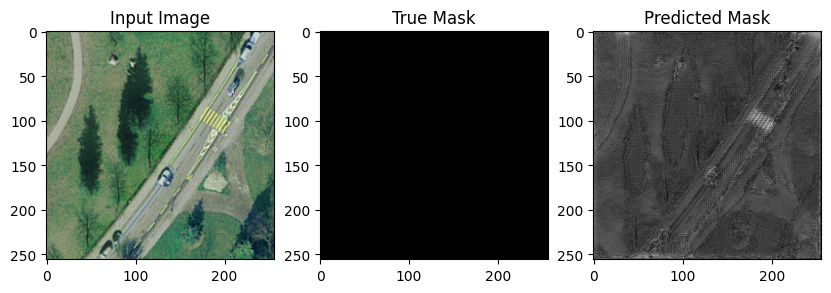

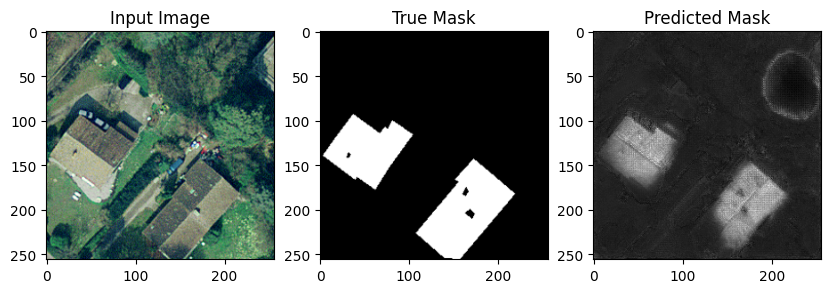

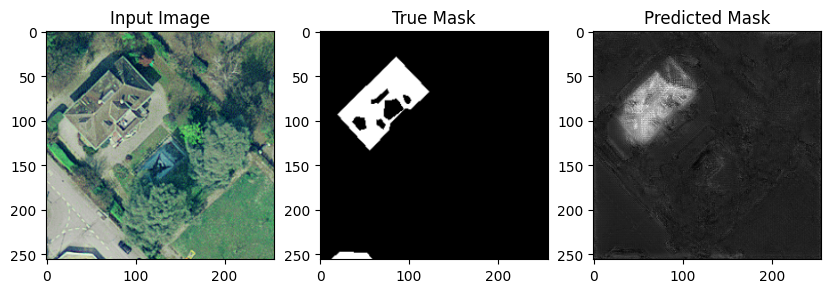

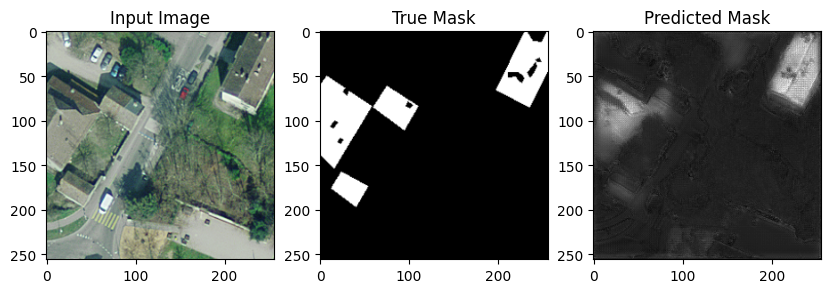

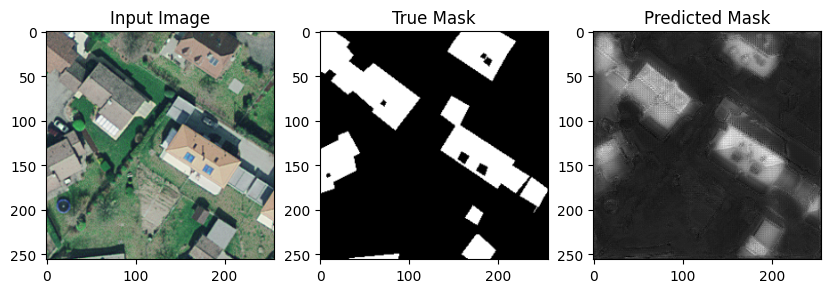

...

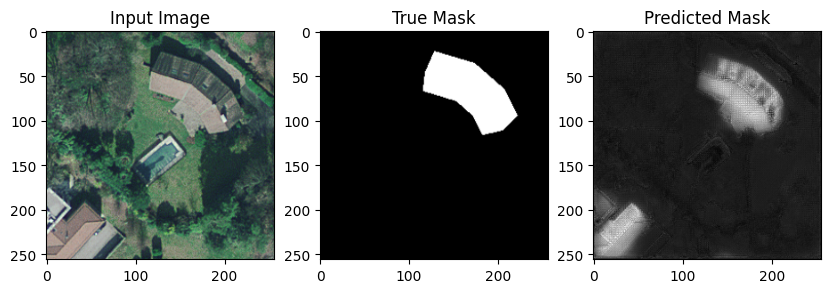

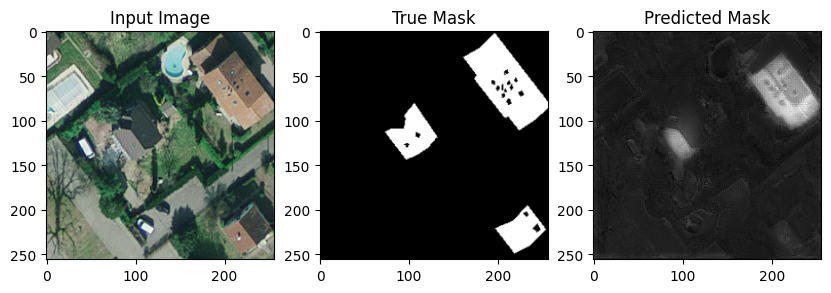

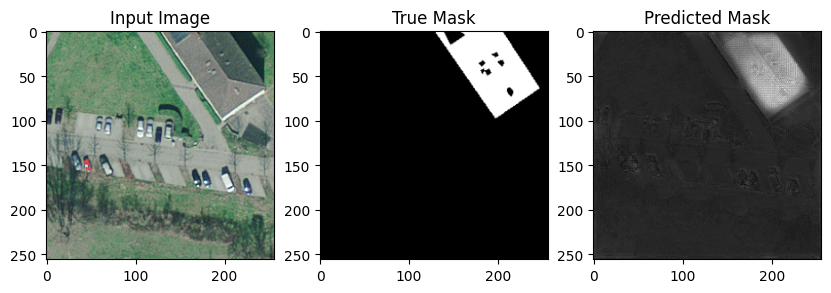

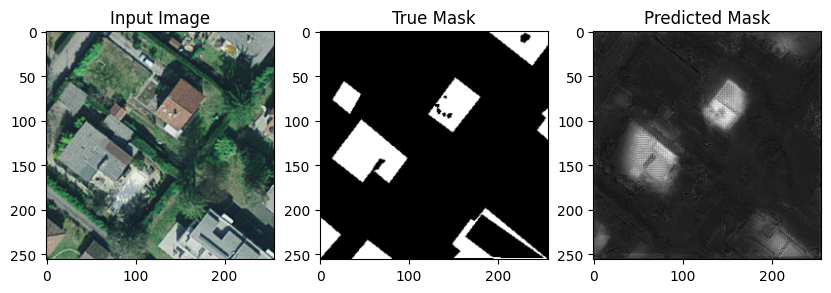

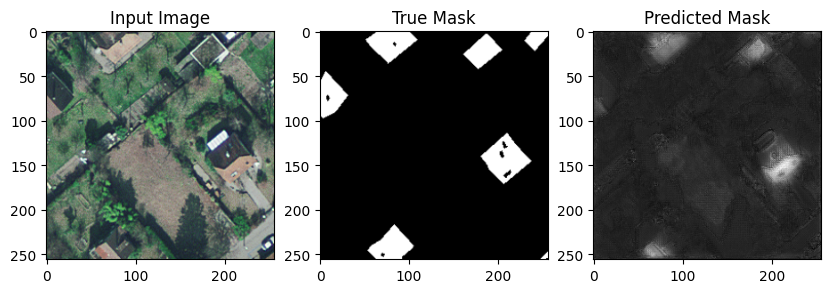

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


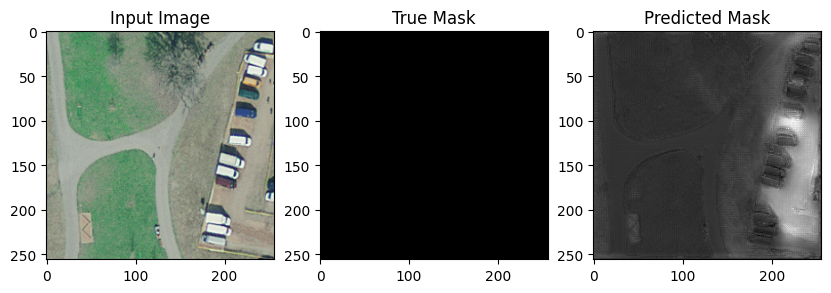

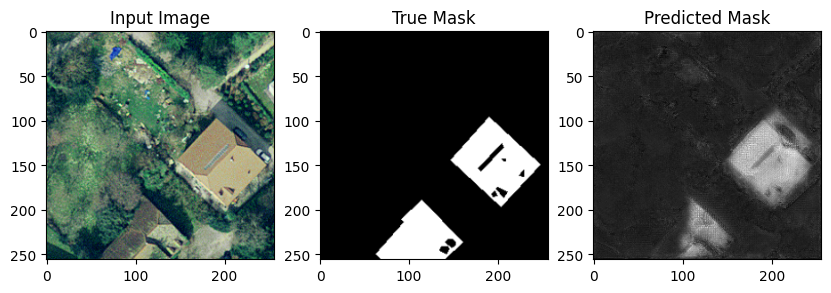

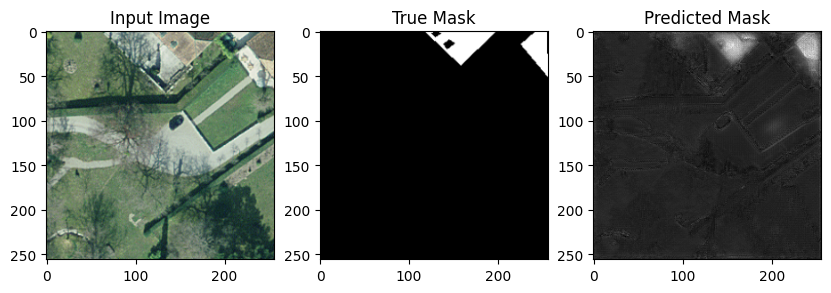

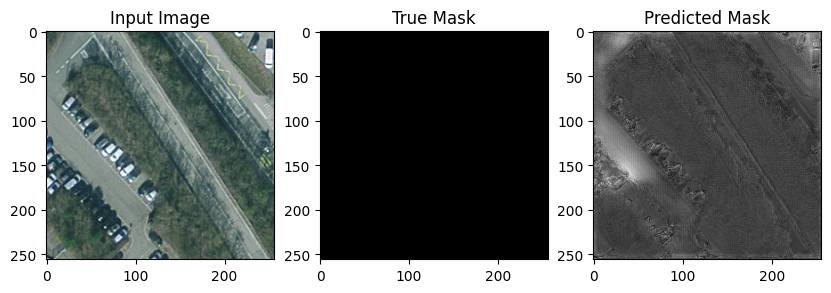

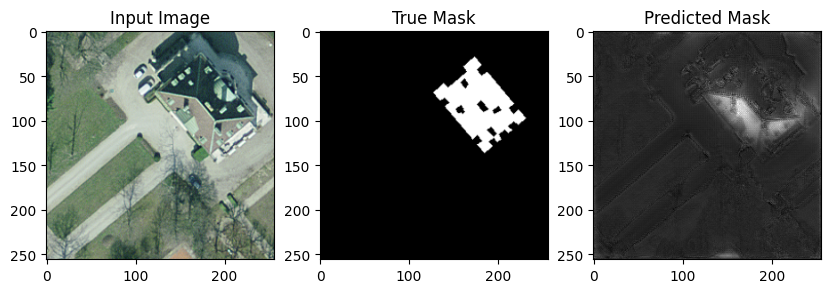

...

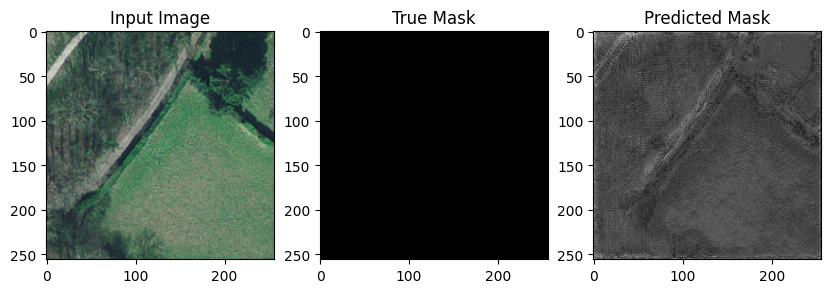

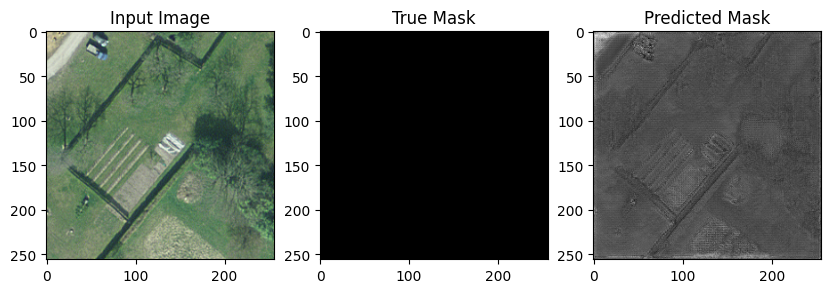

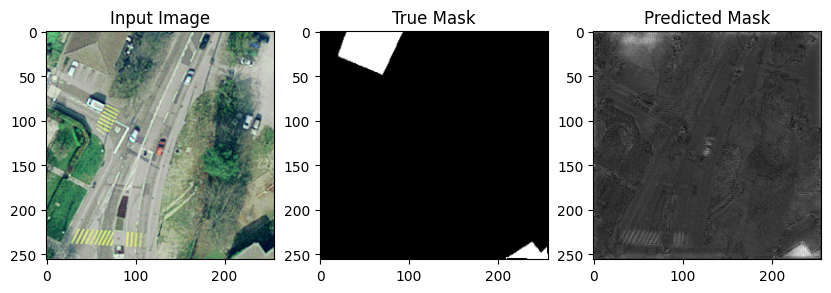

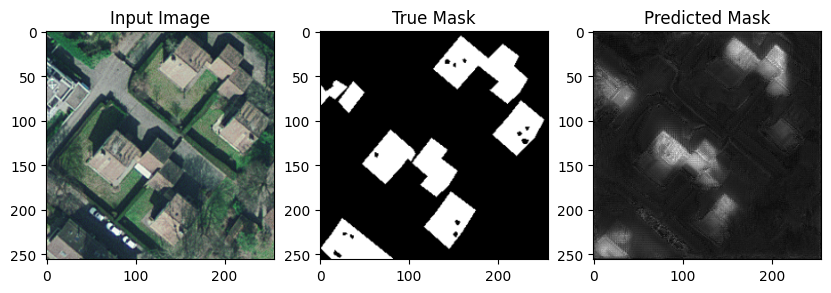

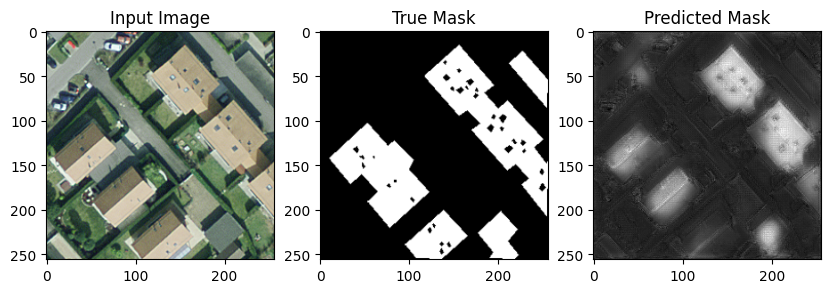

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


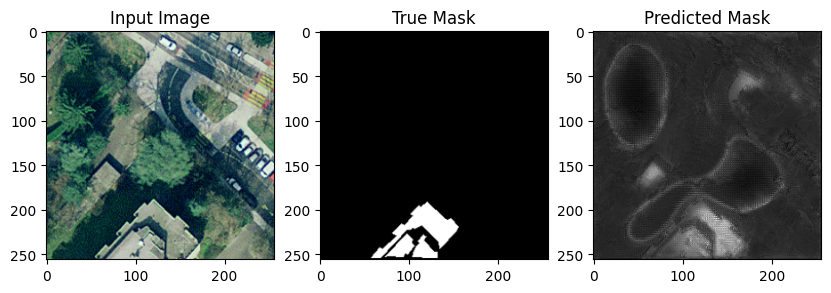

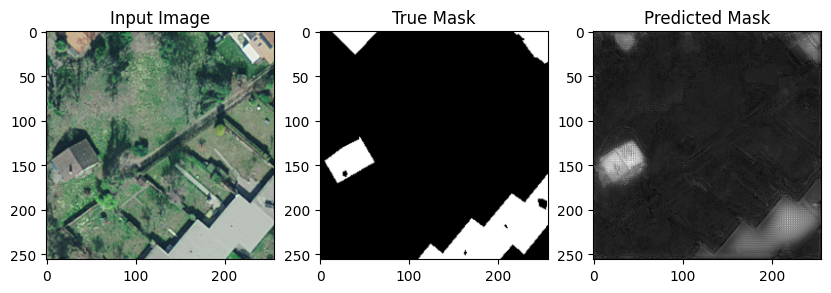

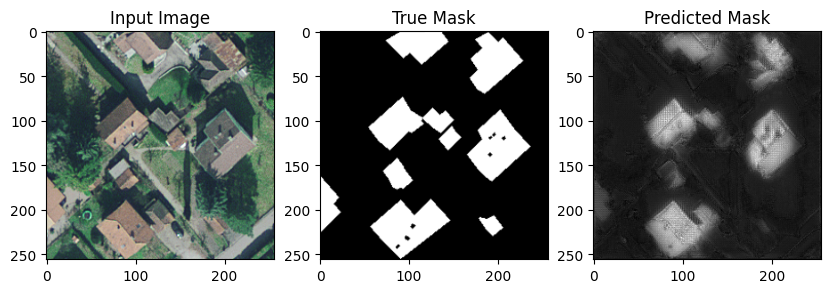

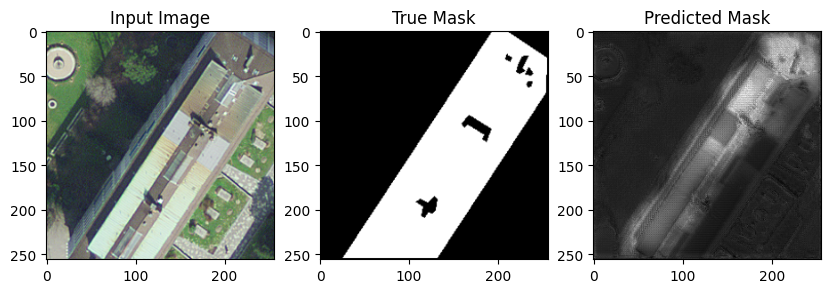

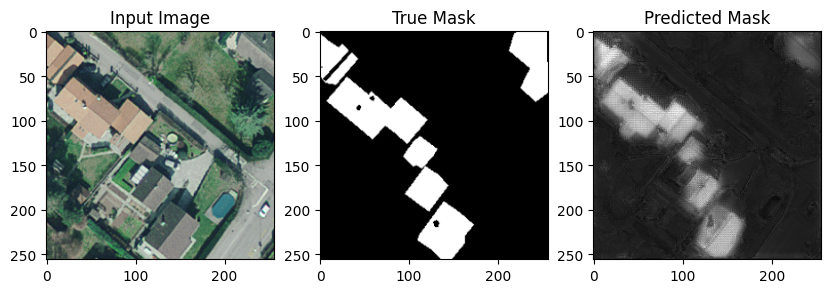

...

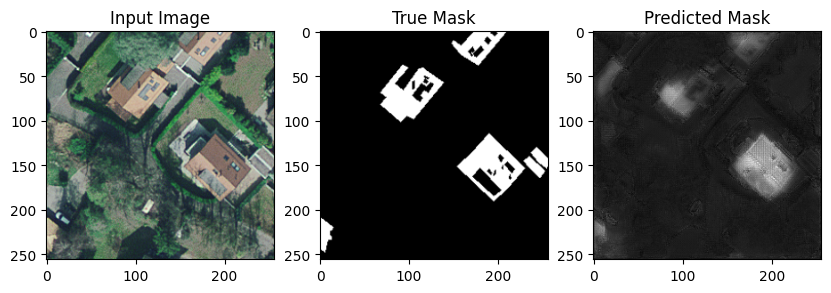

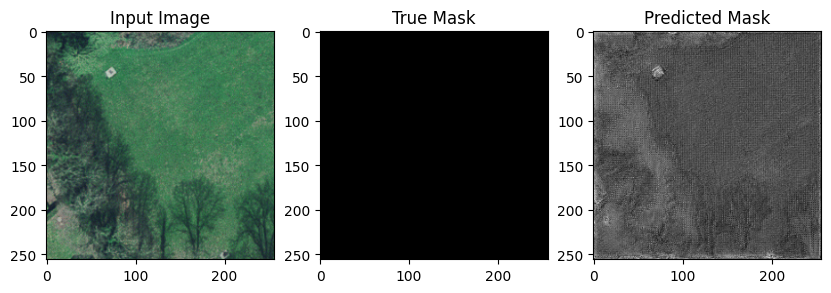

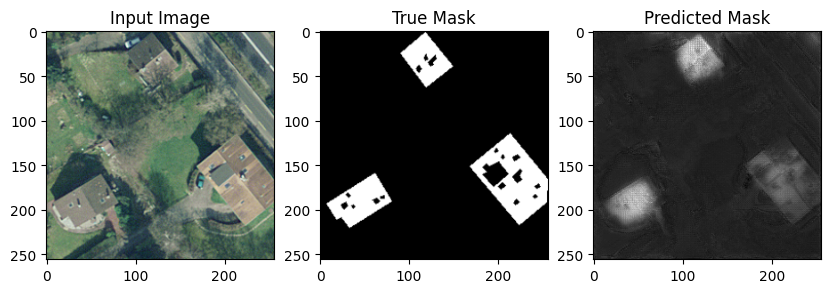

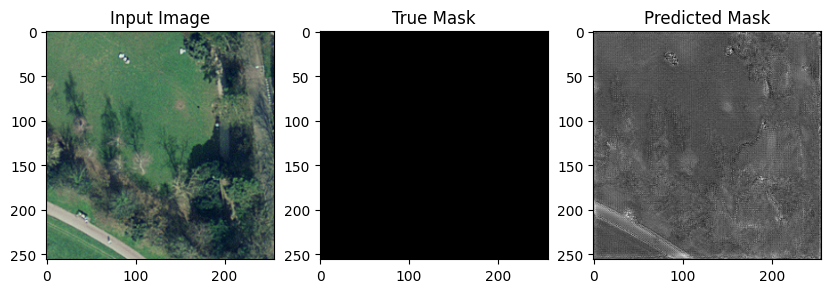

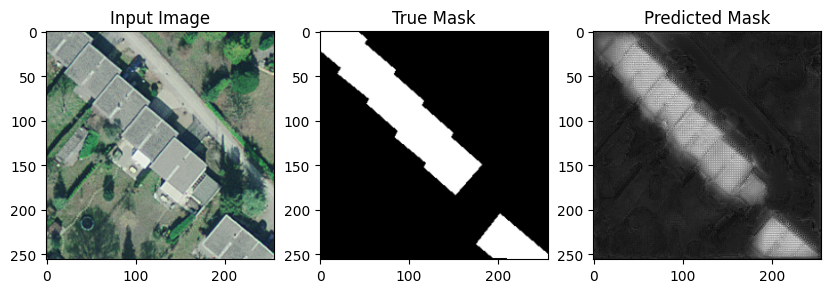

In [12]:
history = model.fit(train_dataset, epochs=50, validation_data=val_dataset, callbacks=callbacks)

def show_predictions(dataset, num=3):
    for images, masks in dataset.take(num):
        preds = model.predict(images)
        for i in range(len(images)):
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(images[i])
            plt.title('Input Image')
            plt.subplot(1, 3, 2)
            plt.imshow(masks[i].numpy().squeeze(), cmap='gray')
            plt.title('True Mask')
            plt.subplot(1, 3, 3)
            plt.imshow(preds[i].squeeze(), cmap='gray')
            plt.title('Predicted Mask')
            plt.show()

show_predictions(val_dataset)